In [2]:
# Import libraries

import numpy as np
import pandas as pd
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #Adjusts the configure of the plots we will create

#Read in the data

df = pd.read_csv('C:\\Users\\lolic\\Desktop\\Data science\\Independent project\\New folder\\movies.csv')


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7668 entries, 0 to 7667
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      7668 non-null   object 
 1   rating    7591 non-null   object 
 2   genre     7668 non-null   object 
 3   year      7668 non-null   int64  
 4   released  7666 non-null   object 
 5   score     7665 non-null   float64
 6   votes     7665 non-null   float64
 7   director  7668 non-null   object 
 8   writer    7665 non-null   object 
 9   star      7667 non-null   object 
 10  country   7665 non-null   object 
 11  budget    5497 non-null   float64
 12  gross     7479 non-null   float64
 13  company   7651 non-null   object 
 14  runtime   7664 non-null   float64
dtypes: float64(5), int64(1), object(9)
memory usage: 898.7+ KB


In [4]:
# Let's look at the data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [5]:
# Let's see if there is any missing data

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col,pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [6]:
#alternative option to check missing data

df.isnull().sum() # count of missing values

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [7]:
df.isnull().mean() # proportion

name        0.000000
rating      0.010042
genre       0.000000
year        0.000000
released    0.000261
score       0.000391
votes       0.000391
director    0.000000
writer      0.000391
star        0.000130
country     0.000391
budget      0.283125
gross       0.024648
company     0.002217
runtime     0.000522
dtype: float64

Cleaning the Data

In [8]:
# Fill the missing values 
#impute the values as per the datatype of the columns - numeric columns with mean
numeric_cols = df.select_dtypes(include='number').columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].mean())

#impute the values as per the datatype of the columns - categorical columns with mode
categorical_cols = ['rating','released','country']
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])

In [9]:
df.isnull().sum()

name         0
rating       0
genre        0
year         0
released     0
score        0
votes        0
director     0
writer       3
star         1
country      0
budget       0
gross        0
company     17
runtime      0
dtype: int64

In [10]:
# Data types for our columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [11]:
# change data type of columns
df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

In [12]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [13]:
#create correct year column

df['yearcorrect'] = df['released'].astype(str).str.split().str[2]

In [14]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [15]:
df = df.sort_values(by=['gross'],inplace=False,ascending=False)

In [16]:
pd.set_option('display.max_rows',None)

In [17]:
# Drop any duplicates

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.000000,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.400000,9.030000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.000000,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.800000,1.100000e+06,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.000000,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.800000,8.760000e+05,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.000000,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.400000,8.970000e+05,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.000000,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.900000,2.220000e+05,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.000000,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.000000,5.930000e+05,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.000000,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.000000,1.300000e+06,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.000000,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.100000,3.700000e+05,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.000000,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.800000,1.480000e+05,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.000000,2019


In [18]:
# Hypothesis: Gross correlation
# Budge high correlation 
# Company high correlation


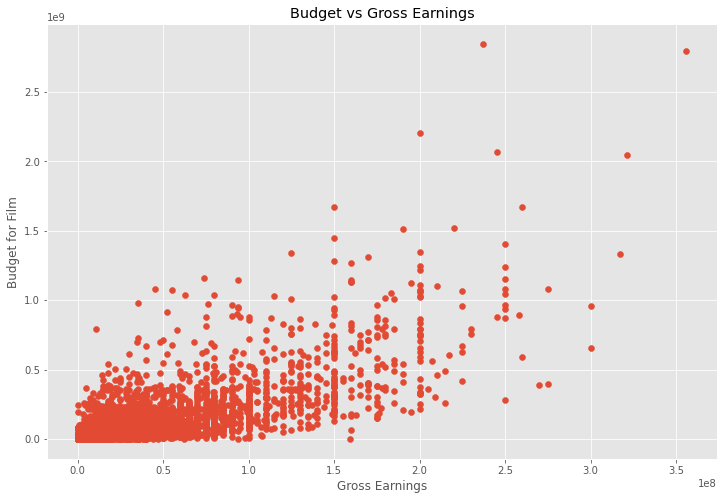

In [19]:
# Scatter plot with budge vs gross

plt.scatter(x=df['budget'],y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Budget for Film')
plt.show()

In [20]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


<AxesSubplot:xlabel='budget', ylabel='gross'>

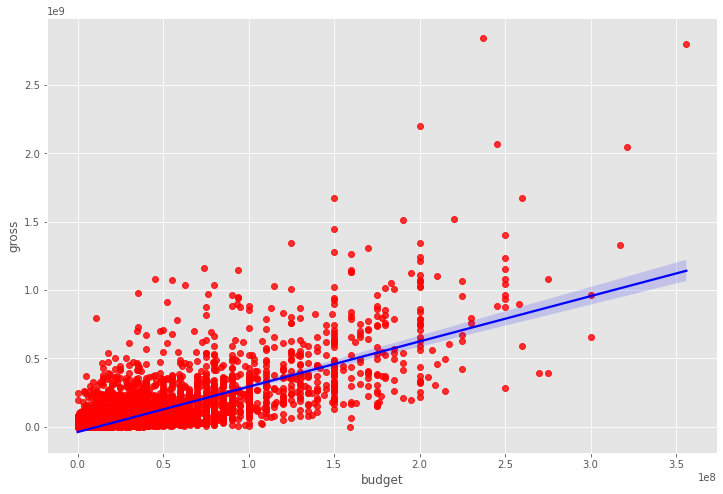

In [21]:
# Plot budget vs gross using seaborn

sns.regplot(x='budget',y='gross',data=df,scatter_kws={'color':'red'},line_kws={'color':'blue'})

In [22]:
# Let's start looking at correlation

In [23]:
df.corr()  #only working on numerical value

,year,score,votes,budget,gross,runtime
year,1.000000,0.097936,0.222810,0.265578,0.252042,0.120766
score,0.097936,1.000000,0.409182,0.064541,0.182868,0.399329
votes,0.222810,0.409182,1.000000,0.421007,0.628713,0.309166
budget,0.265578,0.064541,0.421007,1.000000,0.711270,0.265287
gross,0.252042,0.182868,0.628713,0.711270,1.000000,0.241335
runtime,0.120766,0.399329,0.309166,0.265287,0.241335,1.000000


In [24]:
# High correlation between budgget and gross, I was right.
# Votes has high correlation as well 0.628

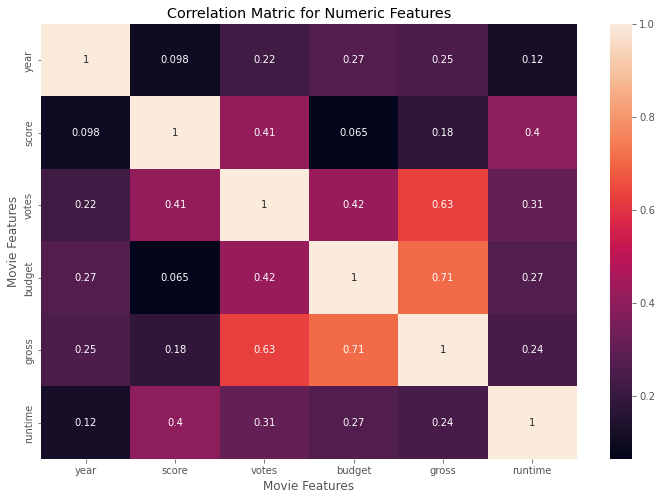

In [25]:
correlation_matrix = df.corr(method='pearson') # pearson,kendal,spearman
sns.heatmap(correlation_matrix,annot=True)
plt.title('Correlation Matric for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')
plt.show()

In [26]:
df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes
df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,533,5,0,2009,696,7.800000,1.100000e+06,1155,1778,2334,55,237000000,2847246203,2253,162.000000,31
7445,535,5,0,2019,183,8.400000,9.030000e+05,162,743,2241,55,356000000,2797501328,1606,181.000000,41
3045,6896,5,6,1997,704,7.800000,1.100000e+06,1155,1778,1595,55,200000000,2201647264,2253,194.000000,19
6663,5144,5,0,2015,698,7.800000,8.760000e+05,1125,2550,524,55,245000000,2069521700,1540,138.000000,37
7244,536,5,0,2018,192,8.400000,8.970000e+05,162,743,2241,55,321000000,2048359754,1606,149.000000,40
7480,6194,4,2,2019,1488,6.900000,2.220000e+05,1455,1919,676,55,260000000,1670727580,2316,118.000000,41
6653,2969,5,0,2015,1704,7.000000,5.930000e+05,517,3568,437,55,150000000,1670516444,2281,124.000000,37
6043,5502,5,0,2012,2472,8.000000,1.300000e+06,1517,2314,2241,55,220000000,1518815515,1606,143.000000,34
6646,2145,5,0,2015,221,7.100000,3.700000e+05,1189,706,2721,55,190000000,1515341399,2281,137.000000,37
7494,2131,4,2,2019,2676,6.800000,1.480000e+05,432,1950,1527,55,150000000,1450026933,2315,103.000000,41


In [27]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,533,5,0,2009,696,7.8,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,31
7445,535,5,0,2019,183,8.4,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,41
3045,6896,5,6,1997,704,7.8,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,19
6663,5144,5,0,2015,698,7.8,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,37
7244,536,5,0,2018,192,8.4,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,40


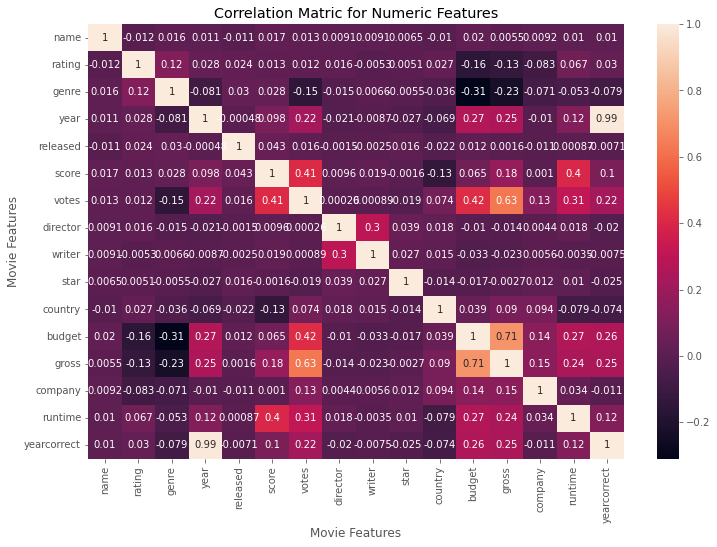

In [28]:
correlation_matrix = df_numerized.corr(method='pearson') # pearson,kendal,spearman
sns.heatmap(correlation_matrix,annot=True)
plt.title('Correlation Matric for Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')
plt.show()

In [29]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.012441,0.016355,0.011453,-0.011087,0.017095,0.013086,0.009079,0.009081,0.006472,-0.010425,0.020368,0.005466,0.009211,0.010390,0.010268
rating,-0.012441,1.000000,0.123465,0.027931,0.023643,0.013246,0.012378,0.016255,-0.005289,0.005092,0.026930,-0.156544,-0.130083,-0.083227,0.066641,0.030153
genre,0.016355,0.123465,1.000000,-0.081261,0.029997,0.027959,-0.145276,-0.015258,0.006567,-0.005477,-0.035896,-0.310566,-0.230267,-0.071067,-0.052699,-0.078859
year,0.011453,0.027931,-0.081261,1.000000,-0.000484,0.097936,0.222810,-0.020795,-0.008656,-0.027242,-0.069423,0.265578,0.252042,-0.010431,0.120766,0.990591
released,-0.011087,0.023643,0.029997,-0.000484,1.000000,0.042617,0.016114,-0.001492,-0.002508,0.015789,-0.022042,0.012267,0.001637,-0.010969,0.000867,-0.007090
score,0.017095,0.013246,0.027959,0.097936,0.042617,1.000000,0.409182,0.009559,0.019410,-0.001609,-0.134577,0.064541,0.182868,0.001030,0.399329,0.103158
votes,0.013086,0.012378,-0.145276,0.222810,0.016114,0.409182,1.000000,0.000260,0.000891,-0.019277,0.073582,0.421007,0.628713,0.133129,0.309166,0.218431
director,0.009079,0.016255,-0.015258,-0.020795,-0.001492,0.009559,0.000260,1.000000,0.299067,0.039234,0.017926,-0.010364,-0.014272,0.004404,0.017624,-0.019710
writer,0.009081,-0.005289,0.006567,-0.008656,-0.002508,0.019410,0.000891,0.299067,1.000000,0.027245,0.015298,-0.033216,-0.023210,0.005646,-0.003510,-0.007491
star,0.006472,0.005092,-0.005477,-0.027242,0.015789,-0.001609,-0.019277,0.039234,0.027245,1.000000,-0.013833,-0.016628,-0.002682,0.012442,0.010171,-0.025233


In [30]:
correlation_mat = df_numerized.corr()
corr_pairs = correlation_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.012441
             genre          0.016355
             year           0.011453
             released      -0.011087
             score          0.017095
             votes          0.013086
             director       0.009079
             writer         0.009081
             star           0.006472
             country       -0.010425
             budget         0.020368
             gross          0.005466
             company        0.009211
             runtime        0.010390
             yearcorrect    0.010268
rating       name          -0.012441
             rating         1.000000
             genre          0.123465
             year           0.027931
             released       0.023643
             score          0.013246
             votes          0.012378
             director       0.016255
             writer        -0.005289
             star           0.005092
             country        0.026930
 

In [31]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

genre        budget        -0.310566
budget       genre         -0.310566
genre        gross         -0.230267
gross        genre         -0.230267
rating       budget        -0.156544
budget       rating        -0.156544
votes        genre         -0.145276
genre        votes         -0.145276
country      score         -0.134577
score        country       -0.134577
gross        rating        -0.130083
rating       gross         -0.130083
             company       -0.083227
company      rating        -0.083227
year         genre         -0.081261
genre        year          -0.081261
runtime      country       -0.079265
country      runtime       -0.079265
genre        yearcorrect   -0.078859
yearcorrect  genre         -0.078859
country      yearcorrect   -0.074023
yearcorrect  country       -0.074023
company      genre         -0.071067
genre        company       -0.071067
country      year          -0.069423
year         country       -0.069423
genre        runtime       -0.052699
r

In [32]:
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

gross        votes          0.628713
votes        gross          0.628713
budget       gross          0.711270
gross        budget         0.711270
yearcorrect  year           0.990591
year         yearcorrect    0.990591
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [ ]:
# Votes and budget has the highest correlation to gross earnings.

#Company has low correlation
#I was wrong